# Monte Carlo Simulation of Transport for Sr-II

In [1]:
import jax
import jax.numpy as jnp 
from jax import random, vmap, jit
import diffrax
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# for animations in Jupyter notebooks
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

## Physical setup

### Theory | 1D simulation
_________


The 1D "conveyor-belt" optical lattice is constructed by the interference of two counter-propagating laser beams (ignoring polarization) 

$$
\begin{align*}
E_1 (x,y,z, t) &= E_1(x,y,z) \cos(kz - \omega t)\\
E_2 (x,y,z, t) &= E_2(x,y,z) \cos(-kz - \omega t + \Delta \phi (t))
\end{align*}
$$

where $k = \frac{2\pi}{\lambda}$ is the wavenumber, $\omega$ is the angular frequency of the laser (in radians/s), $E_1, E_2$ are the field envelopes, and $\Delta \phi (t)$ is the time-dependent phase difference between the beams. As we will see later, the time dependence allows us to "move" the lattice at will. 

For the first steps of the simulation, we will consider the envelopes $E_1, E_2$ to be constant since we will start by simulating only the trapping dimension, but later we will consider them as gaussian beams with a variable waist.

Adding the fields, calculating the intensity ($I = |E|^2$) and time-averaging over one period $T = \frac{2\pi}{\omega}$ we find

$$
I(z,t) = I_1(z) + I_2(z) + 2\sqrt{I_1(z)I_2(z)} \cos(2kz - \Delta \phi(t))
$$

where $I_1, I_2$ are the laser field intensities.

Now, for off-resonant light, the dipole trap potential is given by

$$
U(z,t) = - \frac{\operatorname{Re}{(\alpha)}}{2 \epsilon_0 c} I(z,t),
$$

where $\alpha$ is the atomic polarizability. Substituting the previous expression for $I(z,t)$ we find

$$
U(z,t) = - \frac{\operatorname{Re}{(\alpha)}}{2 \epsilon_0 c} \left(I_1(z) + I_2(z) + 2\sqrt{I_1(z)I_2(z)} \cos(2kz - \Delta \phi(t))\right).
$$

This consists of a constant term and a time- and position-dependent term. The constant term will not affect the dynamics since only spatially varying components of the potential manifest as forces, so we discard it and obtain

$$
U(z,t) = - \frac{\operatorname{Re}{(\alpha)} \sqrt{I_1(z)I_2(z)}}{\epsilon_0 c} \cos(2kz - \Delta \phi(t)).
$$

Moving forward, we stop explicitly noting the $z$ dependence of the intensities. Moreover, we define

$$
z_0(t) := \frac{\Delta \phi(t)}{2k}
$$

and substitute to obtain

$$
U(z,t) = - \frac{\operatorname{Re}{(\alpha)} \sqrt{I_1 I_2}}{\epsilon_0 c} \cos(2k[z - z_0(t)]).
$$

Finally, using the trigonometric identity $\cos(2\theta) = 2\cos^2(\theta) - 1$, we can rewrite this as

$$
U(z,t) = - U_0 \cos^2(k[z - z_0(t)]) + \text{const},
$$

with

$$
U_0 = \frac{2\,\operatorname{Re}{(\alpha)}}{\epsilon_0 c} \sqrt{I_1 I_2}.
$$

The constant offset is again irrelevant for the dynamics, so the effective lattice potential is

$$
\boxed{\,U(z,t) = - U_0 \cos^2\!\big(k[z - z_0(t)]\big)\,}.
$$


Sources:

https://www.college-de-france.fr/sites/default/files/media/document/2023-03/Dalibard%202012-2013%20%E2%80%93%20Notes%20de%20cours%20%28version%20anglaise%29.pdf

We can plot this to see how different $\Delta \phi (t)$ affect the movement of the lattice


In [2]:
# defining the lattice potential

def linear_phi(t):

    return 2 * jnp.pi * 0.1 * t  # example: linear ramp

def constant_phi(t):

    return 0.0

def quadratic_phi(t):
    
    return 0.5 * t**2

def cotangent_phi(t):
    
    return jnp.arctan(t)

# z0(t) is the position of a lattice site as a function of time
def z0(t, k = 2 * jnp.pi / 1.0):
    
    return quadratic_phi(t)/ (2 * k)

def U(z,t, U0=1.0, k=2 * jnp.pi / 1.0):
    

    U0 = 1.0  # depth of the lattice
    k = 2 * jnp.pi / 1.0  # wavevector of the lattice light 
    return -U0 * jnp.cos(k * (z - z0(t)))**2

In [3]:
z = jnp.linspace(-jnp.pi/2, jnp.pi/2, 200)
t = jnp.linspace(0, 2 * jnp.pi , 100)

# we can speed this up by vectorizing U over z and t
U_vec = jax.vmap(lambda ti: U(z, ti))
U_vals = U_vec(t)

# we also want to visualize the time dependent phase
phi_vals = quadratic_phi(t)

#### Lattice visualization

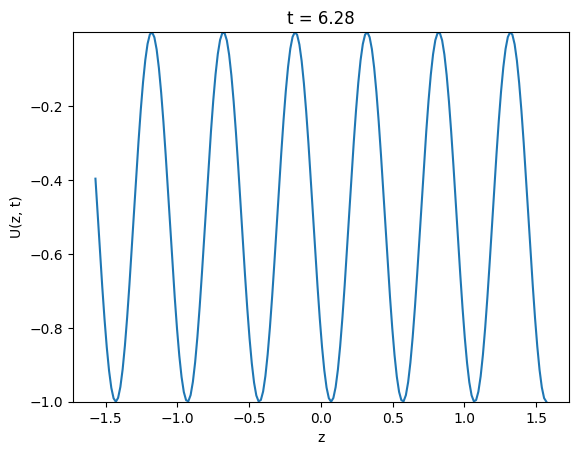

In [4]:
%matplotlib inline

fig, ax = plt.subplots()
line, = ax.plot(z, U_vals[0])
ax.set_ylim(jnp.min(U_vals), jnp.max(U_vals))
ax.set_xlabel('z')
ax.set_ylabel('U(z, t)')

def update(frame):
    line.set_ydata(U_vals[frame])
    ax.set_title(f"t = {t[frame]:.2f}")
    return line,

ani = FuncAnimation(fig, update, frames=len(t), interval=50, blit=True)
HTML(ani.to_jshtml())

#### Lattice + Phase visualization

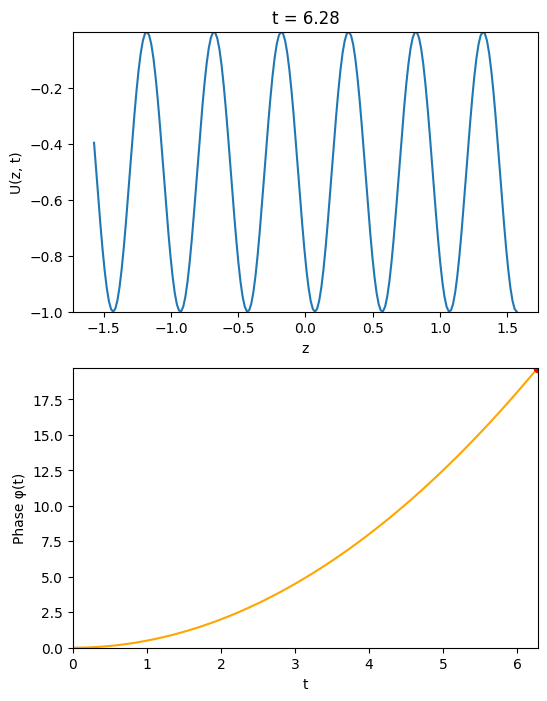

In [5]:
%matplotlib inline

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 8))

# Lattice potential plot
line1, = ax1.plot(z, U_vals[0])
ax1.set_ylim(jnp.min(U_vals), jnp.max(U_vals))
ax1.set_xlabel('z')
ax1.set_ylabel('U(z, t)')

# Phase plot
line2, = ax2.plot(t, phi_vals, color='orange')
phase_dot, = ax2.plot([t[0]], [phi_vals[0]], 'ro')
ax2.set_xlim(jnp.min(t), jnp.max(t))
ax2.set_ylim(jnp.min(phi_vals), jnp.max(phi_vals))
ax2.set_xlabel('t')
ax2.set_ylabel('Phase φ(t)')

def update(frame):
    line1.set_ydata(U_vals[frame])
    ax1.set_title(f"t = {t[frame]:.2f}")
    phase_dot.set_data([t[frame]], [phi_vals[frame]])
    return line1, phase_dot

ani = FuncAnimation(fig, update, frames=len(t), interval=50, blit=True)
HTML(ani.to_jshtml())

Cool! On to the simulation!

## Simulation

### Theory

From the potential, in principle it is straightforward to just write down the equations of motion along the trapped dimension:

$$
F = m \ddot{z}
$$

where 

$$
F = - \frac{\partial }{\partial z} U
$$


However, just going straight into simulating these potential has a few problems. For startes, it is going to be hard to track the position of the atoms. Since we want to move the potential enough to move the atoms a few meters, the $z$ coordinate will have a lot of variation, and I am sure that is not great for numerical stability. What's more, as the particle moves, the potential well it is trapped in also moves (it literally slides in the $z$ plance), so keeping track of the particle and which well it is in might be tricky. I am sure there are many other problems, or perhaps these are not great problems, but it turns out there is another approach. 

In principle, we should only care about how the particle moves (behaves) inside a single well, so what matters is the relative motion of the motion with respect to the moving well. Recall too that the motion of the well (i.e. the position of "valleys") is encoded in $z_0(t)$. So, to make the problem slightly easier to simulate, we fill change coordinates so we are moving from the lab frame to the lattice frame or the comoving frame (that's how they refer to it in the french notes I found). That is, we will study the motion of the atoms in the frame given by 

$$
y := z - z_0(t)
$$

(a new coordinate frame with center at the $z_0(t)$ position, which varies in time). This hopefully will make the simulations easier!

From the definition of $y$ it follows that

$$
m \ddot y := m (\ddot z - \ddot z_0(t)) = m( -\frac{\partial U}{\partial z} - \ddot z_0(t))
$$

and 

$$
\frac{\partial U}{\partial z} = 2 k U_0  \cos(k[z - z_0(t)]) \sin(k[z - z_0(t))) = k U_0 \sin(2k [z - z_0(t)])
$$

where for the last step I used a double angle identity. Finally, putting it all together and subsitutiting $y = z - z_0(t)$ and $\ddot z_0(t) = \frac{\ddot \phi(t)}{2 k}$ we find

$$
\boxed{m \ddot y = - k U_0 \sin(2k y) - m \frac{\ddot \phi(t)}{2 k}}
$$

(I originally went through the entire Hamiltonian formulation, but it was as simple as just writing down $F = ma$...)



Cool! We could almost be done, but if I learned anything in applied math last semester (thanks, Michael Brenner) is that you should try to non-dimensionalize your equations. So, let's do that.

We have an equation for acceleration $\frac{d^2 y}{d t^2}$ in terms of a $y$ and $\frac{d^2\phi}{dt^2}$, each with dimensions:

$$
[y] = L, \;\;\; \left[\frac{d^2 y}{d t^2}\right] = \frac{L}{T^2}, \;\;\; \left[ \frac{d^2 \phi}{d t^2} \right] = \frac{1}{T^2}
$$

so we must find some "natural" or "characteristic" time and lengthscales to nondimensionalize our equation. By inspecting the dimensions of the constants involved in the equation, notice that if we define

$$
L_c = \frac{1}{k}, \;\;\; T_c = \sqrt{\frac{m}{U_0 k^2}}
$$
then we have 
$$
\left[L_c \right] = L, \;\;\; \left[ T_c \right] = T
$$

And thus we can define the dimensionless variables

$$
\tilde{y} = \frac{y}{L_c} = ky, \;\;\; \tau = \frac{t}{T_c} = t \sqrt{\frac{U_0 k^2}{m}}
$$

Check my notes for an entire derivation, but essentially this allows us to write down

$$
\frac{d^2}{dt^2} = \left( \frac{d \tau}{ dt} \right)^2 \frac{d^2}{d\tau^2}
$$

which after some substitution and algebraic manipulation yields the dimensionless equation


$$
\boxed{\frac{d^2 \tilde{y}}{d \tau^2} = - \sin(2 \tilde{y}) - \frac{1}{2} \frac{d^2 \phi}{d\tau^2}}
$$



We can think of this equation of motion as arising from an effective potential. To find it, we can integrate:

$$
U_{eff} (\tilde{y}, \tau) = \int d\tilde{y} \; \sin(2 \tilde{y}) + \frac{1}{2} \frac{d^2 \phi}{d \tau^2} (\tau) = -\frac{1}{2}\cos(2 \tilde{y}) + \frac{\tilde{y}}{2} \frac{d^2 \phi}{d \tau^2} (\tau)
$$

which essentially becomes a static lattice potential with a time dependent tilt (linear in $\tilde{y}$).

Awesomeeee!!!!!! Finally, just so we can use a numerical solver, we convert this into a system of 1st order ODEs


We define a state vector

$$
s = \begin{bmatrix}
\tilde{y}\\
\frac{d\tilde{y}}{d\tau}
\end{bmatrix}
$$

and

$$
\frac{ds}{dt} = \begin{bmatrix}
\frac{d\tilde{y}}{d\tau}\\
\frac{d^2\tilde{y}}{d\tau^2}
\end{bmatrix} = \begin{bmatrix}
\frac{d\tilde{y}}{d\tau}\\
- \sin(2 \tilde{y}) - \frac{1}{2} \frac{d^2 \phi}{d\tau^2}
\end{bmatrix}
$$



Now, we wish to measure whether a particle remains trapped or not, and for that the probably most useful condition (although I'm more and more convinced it is not necessary nor sufficient, but I am not 100% sure yet) to check is whether the total mechanical energy of the particle (kinetic plus potential) is below the potential barrier. 

Now, if we were to run the simulations as they are rn, it would probably be completely unfeasible and plagued with numerical error. The particle is oscillating within the well with a frequency on the order of a few KHz (the calculation should be straiggtforward if we assume the potential is harmonic and the system basically becomes a driven harmonic oscillator, but even before that the chatacteristic time $\tau$ is quite small and should give un an idea of the timescales we are dealing with) and the characterisitc lengthscale is very small (of the same order as the laser wavelength...), so our timesteps for a reasonaly precise simulations have to be small and withing these scales. But this is a huge problem, because we want to someow simulate the transport of these particles over a distance on the order of 1 meter... 

But hope is not yet lost... looking at the equation, and thinking about the physics, it turns out we do not need to simulate the entire passage of time. Rather, we only need to study the times when the lattice is accelerating, since when the acceleration is 0, the comoving frame becomes an inertial frame and energy is conserved, and so if the particle is trapped at that instant, the particle will remain trapped as long as the acceleration is zero. We can also arrive at a similar conclusion thinking about the system in a different way: the potential $U_{eff}$ has a maximum barrier when the acceleration is 0, so if the particle is trapped when the acceleration is not 0, then we can be sure that it will remain trapped once it is 0. 


Let's finally write some code!

First, we define a few constants for our experiment:

In [6]:
LASER_LAMDA = 532e-9  # wavelength of the lattice laser in meters
SR_MASS = 1.44316060e-25  # mass of Sr-88 atom in kg
U0 = 100 # lattice depth in microkelvin
SR_TEMP = 5 # atom temperature in Kelvin

K_BOLTZMANN = 1.380649e-23  # Boltzmann constant in J/K

In [7]:
k = 2 * jnp.pi / LASER_LAMDA  # wavevector of the lattice light in 1/m

SR_ENERGY = (SR_TEMP * 1e-6) * K_BOLTZMANN  # thermal energy of the atoms in J
U0_J = (U0 * 1e-6) * K_BOLTZMANN  # lattice depth in J

In [8]:
Tc = jnp.sqrt(SR_MASS/(U0_J * k**2)) * 1e9 # Characteristic time scale in nanoseconds
Lc = (1/k) * 1e9  # Characteristic length scale in nanometers

print(f"Characteristic time scale Tc: {Tc} ns")
print(f"Characteristic length scale Lc: {Lc} nm")

Characteristic time scale Tc: 865.66015625 ns
Characteristic length scale Lc: 84.67042972488834 nm


Now we must sample some initial conditions for our system! For that let's assume a Boltzmann distribution

$$
P(y, \dot{y}) \propto e^{ \frac{- E_{total}}{k_B T} } 
$$

Where 

$$
E_{total} = \tfrac12 m \dot{y}^2 + U(y)
$$


and since we are starting from an inertail frame with no acceleration, the potential is given by 

$$
U(y) = - U_0 \cos^2\big(ky\big)
$$


Now, notice that we can factorize the exponential into a factor that depends only on position and one that depends only on velocity! This simplifies our calculations since we can now write

$$
P(y) \propto  e^{ \frac{ U_0 \cos^2(ky)}{k_B T}} 
$$

$$
P(\dot{y}) \propto e^{ \frac{ -\tfrac12 m \dot{y}^2}{k_B T}} 
$$


Now, we switch into the dimensionless parameters:

$$
y = \frac{\tilde{y}}{k} , \;\;\;\;\;\; \dot{y} = \frac{d\tilde{y}}{d\tau} \sqrt{\frac{U_0}{m}} = v \sqrt{\frac{U_0}{m}}
$$

such that the total energy becomes

$$
E_{total} = \tfrac12 U_0 v^2 - U_0\cos^2(\tilde{y})
$$

Now we also define a charateristic energy scale $U_0$, such that, dividing the numerator and denominator of the exponential yields

$$
P(\tilde{y}) \propto e^{ \frac{\cos^2(\tilde{y})}{\tilde{T}}} \propto e^{ \frac{\cos(2\tilde{y})}{\tilde{T}}} 
$$

$$
P(v) \propto e^{ \frac{ -v^2}{2\tilde{T}}} 
$$



Where we have defined the dimensionless temperature $\tilde{T} = \frac{k_B T}{U_0}$.



Again, to simplify things, we are only going to simulate particles in one of the potential wells. Recall that the potential is given by

$$
U(\tilde{y}) = -U_0 \cos^2(\tilde{y})
$$

and for simplicity we will assume the particles start in the well given by 

$$ 
\tilde{y} \in (-\frac{\pi}{2}, \frac{\pi}{2})
$$



In [9]:
# we write the samplers for position and velocity


def sample_velocity(key, num_particles, T_tilde):
    """Sample velocities: P(v) ∝ exp(-v²/(2T_tilde))"""
    return jnp.sqrt(T_tilde) * random.normal(key, (num_particles,))

def sample_position_metropolis(key, num_particles, T_tilde):
    """Sample positions: P(y) ∝ exp(cos(2y)/(2T_tilde))"""
    
    # Start uniform in one well [-π/2, π/2]
    positions = (random.uniform(key, (num_particles,)) - 0.5) * jnp.pi
    
    # Metropolis loop
    for i in range(1000):  # 1000 steps
        key, subkey = random.split(key)
        
        # Propose new positions
        proposals = positions + 0.1 * (random.uniform(subkey, (num_particles,)) - 0.5)
        
        # Keep in bounds
        proposals = jnp.clip(proposals, -jnp.pi/2, jnp.pi/2)
        
        # Calculate potential energies using cos(2y) form
        old_potential = -0.5 * jnp.cos(2 * positions)
        new_potential = -0.5 * jnp.cos(2 * proposals)
        delta_potential = new_potential - old_potential
        
        key, subkey = random.split(key)
        accept_prob = jnp.minimum(1.0, jnp.exp(-delta_potential / T_tilde))
        accept = random.uniform(subkey, (num_particles,)) < accept_prob
        
        positions = jnp.where(accept, proposals, positions)
    
    return positions

def sample_initial_conditions(key, num_particles, T_tilde):
    """Sample both position and velocity"""
    key1, key2 = random.split(key)
    
    positions = sample_position_metropolis(key1, num_particles, T_tilde)
    velocities = sample_velocity(key2, num_particles, T_tilde)
    
    return positions, velocities


Position range: [-0.527, 0.541]
Velocity mean: -0.0123, std: 0.2257
Expected velocity std: 0.2236


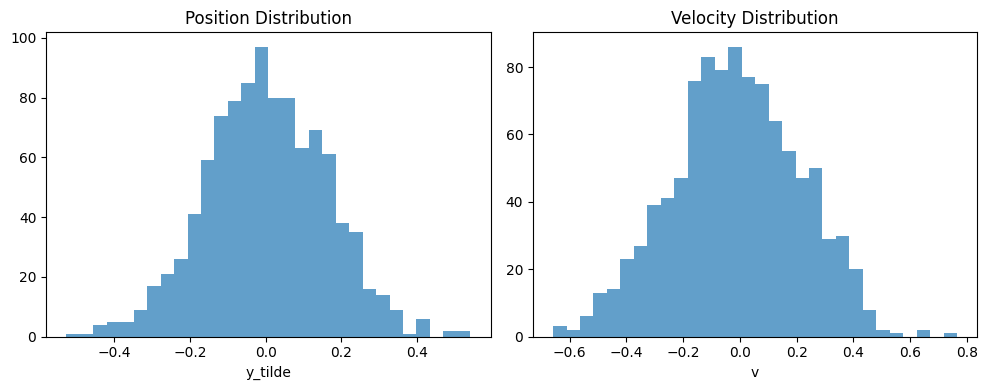

In [10]:
# and we test it!

T_tilde = 0.05 # dimensionless temperature

key = random.PRNGKey(42)
y_tilde, v = sample_initial_conditions(key, 1000, T_tilde)

print(f"Position range: [{jnp.min(y_tilde):.3f}, {jnp.max(y_tilde):.3f}]")
print(f"Velocity mean: {jnp.mean(v):.4f}, std: {jnp.std(v):.4f}")
print(f"Expected velocity std: {jnp.sqrt(T_tilde):.4f}")

# Quick plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

ax1.hist(y_tilde, bins=30, alpha=0.7)
ax1.set_xlabel('y_tilde')
ax1.set_title('Position Distribution')

ax2.hist(v, bins=30, alpha=0.7)
ax2.set_xlabel('v')
ax2.set_title('Velocity Distribution')

plt.tight_layout()
plt.show()


And to be sure this makes sense, we can calculate the total energy of every particle and check that it is below the potential barrier (U = 0) 

In [11]:

kinetic = 0.5 * v**2
potential = -0.5 * jnp.cos(2 * y_tilde)
total_energy = kinetic + potential

# Most should be trapped (E < 0)
trapped_fraction = jnp.mean(total_energy < 0)
print(f"Trapped fraction: {trapped_fraction:.2f}")

Trapped fraction: 1.00


Awesome! This seems to work

Finally, we define a trapping criterion. There are many things to say about this, but for simplicity and to get the simulations up and running I will just check the positions and, if they remain bounded, I will claim the particle is still trapped. In principle, you probably should check the mechanical energy at every point and compare it to the potential barrier at every point, but checking for the potential barrier is not super straigforward and it is computationally more expensive, so let's just sart simple and see what we observe

And we can apparently calculate the final temperature thanks to the equipartition theorem. If we assume that the system after transport still follows a boltzmann distribution, then we have

$$
<\tfrac12 m \dot{y}_f^2> = \tfrac12 k_B T_f
$$

which, in dimensionless units becomes

$$
<v_{f}^2> = \tilde{T}_f
$$

And, since the net velocity of the particles at the end of transport is 0 because the lattice is no longer moving, then it follows that

$$
\tilde{T}_f = \text{Var}(v_f)
$$

### Fixed total $\tau$ and $|a|_{max}$ simulation

Ok! so it is finally time to run the simulations! 

The total acceleration time and its maximum value for now will just be treated as parameters that we can later modify

To start, let's set 


$$
\tau = 20
$$
$$
|a(\tau)|_{max} = 1
$$

And let's start with a step function acceleration


In [12]:
T_tilde = SR_TEMP/U0

total_tau = 20
max_acceleration = 1

num_particles = 1000

key = random.PRNGKey(0)

print(f"Dimensionless temperature T_tilde: {T_tilde:.4f}")
print(f"Total tau: {total_tau}, Max acceleration: {max_acceleration}")
print(f"Number of particles: {num_particles}")

Dimensionless temperature T_tilde: 0.0500
Total tau: 20, Max acceleration: 1
Number of particles: 1000


And we define the minimum jerk trajectory

In [50]:
def x(tau, T, gamma, L):
    t = tau / T
    coeffs = L * jnp.asarray([
        -24 + 16*gamma, 
        60 - 40*gamma, 
        -50 + 32*gamma, 
        15 - 8*gamma, 
        0, 
        0
    ])
    return jnp.polyval(coeffs, t)

# First derivative wrt tau (arg 0)
v = jax.grad(x, argnums=0)

# Second derivative wrt tau (arg 0)
a = jax.grad(v, argnums=0)


# FOURIER ACCELERATION
# def a(tau, total_tau, A_coeffs, B_coeffs):
#     """
#     JAX-compatible Fourier series with separate A and B arrays
    
#     Args:
#         A_coeffs: jnp.array of sine coefficients
#         B_coeffs: jnp.array of cosine coefficients
#     """
#     omega = 2 * jnp.pi / total_tau
    
#     # Create harmonic numbers for each array
#     n_A = jnp.arange(1, len(A_coeffs) + 1)
#     n_B = jnp.arange(1, len(B_coeffs) + 1)
    
#     # Vectorized computation
#     sine_terms = jnp.sum(A_coeffs * jnp.sin(n_A * omega * tau))
#     cosine_terms = jnp.sum(B_coeffs * jnp.cos(n_B * omega * tau))
    
#     return sine_terms + cosine_terms


In [51]:
a(0.5,2, 1.8, 10)

Array(12.75, dtype=float32, weak_type=True)

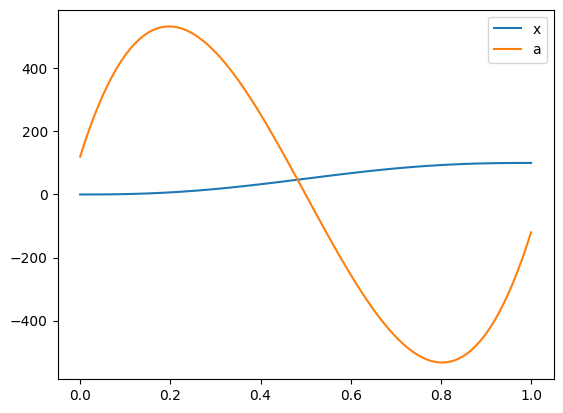

In [56]:
L = 100
T = 1
gamma = 1.8

ts = jnp.linspace(0,T, 100)

xs = [x(tau, T, gamma, L) for tau in ts]

accs = [a(tau, T, gamma, L) for tau in ts]


plt.plot(ts, xs, label = 'x')
plt.plot(ts, accs, label = 'a')
plt.legend()

In [57]:
total_tau = 5
gamma = 1.8
L = 10



@jit
def rhs(tau, state_vector, args=None):
    ''' 
        right-hand side of the equations of motion
        tau: dimensionless time
        state_vector: [y_tilde, v] where y_tilde is the dimensionless position and v (dimensionless velocity) is its derivative with respect to tau (dimensionless time)
    '''
    y_tilde, v = state_vector
    dydtau = v
    dvdtau = -jnp.sin(2 * y_tilde) - 0.5 * a(tau, T = total_tau, gamma = gamma, L = L)
    return jnp.array([dydtau, dvdtau])


In [58]:
@jit
def simulate_trajectory(state_vector, t0=0.0, t1=total_tau, saveat = 500):
    """Solve for one particle - will be vectorized"""

    solver = diffrax.Tsit5()
    
    
    # Save solution at regular time points | NOT SURE WHY THIS IS IMPORTANT/NECESSARY BUT IT SEEMS LIKE IT IS
    saveat = diffrax.SaveAt(ts=jnp.linspace(t0, t1, 1000))

    sol = diffrax.diffeqsolve(
        diffrax.ODETerm(rhs),
        solver,
        t0=t0,
        t1=t1,
        dt0=0.01,
        y0=state_vector,
        saveat=saveat,
    )

    return sol


@jit
def check_trapped_batch(solutions):
    """Check if particles stay within well boundaries throughout simulation"""
    # Extract all position trajectories: shape (num_particles, num_timepoints)
    all_positions = solutions.ys[:, :, 0]
    
    # Check if each particle ever exceeds the well boundary
    max_displacement = jnp.max(jnp.abs(all_positions), axis=1)  # Max |y| for each particle
    
    # Particle is trapped if it never exceeds π/2
    trapped = max_displacement < jnp.pi/2

    # return boolean array indicating trapped status for each particle
    return trapped


@jit
def calculate_final_temperature(solutions, trapped_mask):
    """Calculate effective temperature from final velocity distribution"""
    # Get final velocities of ALL particles
    all_final_velocities = solutions.ys[:, -1, 1]  # Last timepoint, velocity component
    
    # Use jnp.where to filter trapped particles (JAX-compatible)
    final_velocities = jnp.where(trapped_mask, all_final_velocities, 0.0)
    
    # Only calculate variance for actually trapped particles
    num_trapped = jnp.sum(trapped_mask)
    
    # Calculate mean and variance manually for trapped particles only
    trapped_sum = jnp.sum(final_velocities)
    trapped_mean = trapped_sum / num_trapped
    
    # Variance calculation
    squared_deviations = jnp.where(trapped_mask, (all_final_velocities - trapped_mean)**2, 0.0)
    velocity_variance = jnp.sum(squared_deviations) / num_trapped
    
    return velocity_variance, all_final_velocities


# Vectorize to solve all particles at once
simulate_all_trajectories = vmap(simulate_trajectory)


In [59]:
y_tilde, v = sample_initial_conditions(key, num_particles, T_tilde)
state_vectors = jnp.stack([y_tilde, v], axis=1)

# Solve all particles at once
solutions = simulate_all_trajectories(state_vectors)

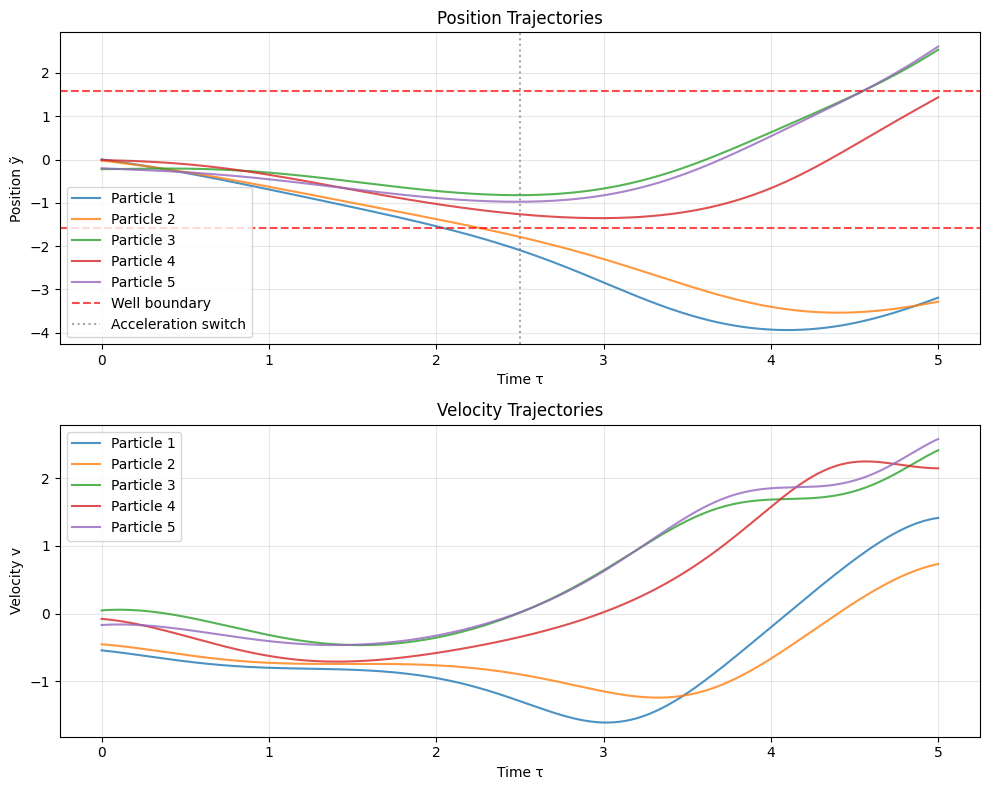

In [60]:
# and we plot the first 5 trajectories

# Extract data
times = solutions.ts[0, :]  # Time array (same for all particles)
positions = solutions.ys[:5, :, 0]  # First 5 particles, all timepoints, position
velocities = solutions.ys[:5, :, 1]  # First 5 particles, all timepoints, velocity

# Plot trajectories
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Position vs time
for i in range(5):
    ax1.plot(times, positions[i, :], label=f'Particle {i+1}', alpha=0.8)

ax1.set_xlabel('Time τ')
ax1.set_ylabel('Position ỹ')
ax1.set_title('Position Trajectories')
ax1.axhline(jnp.pi/2, color='red', linestyle='--', alpha=0.7, label='Well boundary')
ax1.axhline(-jnp.pi/2, color='red', linestyle='--', alpha=0.7)
ax1.axvline(total_tau/2, color='gray', linestyle=':', alpha=0.7, label='Acceleration switch')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Velocity vs time
for i in range(5):
    ax2.plot(times, velocities[i, :], label=f'Particle {i+1}', alpha=0.8)

ax2.set_xlabel('Time τ')
ax2.set_ylabel('Velocity v')
ax2.set_title('Velocity Trajectories')
# ax2.axvline(total_tau/2, color='gray', linestyle=':', alpha=0.7, label='Acceleration switch')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [61]:
# And now we count how many remain trapped

trapped_status = check_trapped_batch(solutions)
trapped_count = jnp.sum(trapped_status)
total_particles = len(trapped_status)
efficiency = trapped_count / total_particles

print(f"Trapped particles: {trapped_count}/{total_particles} ({efficiency*100:.2f}%)")

Trapped particles: 127/1000 (12.70%)


In [62]:
# and theirt final temperatures/velocities

T_final_dimensionless, final_velocities = calculate_final_temperature(solutions, trapped_status)

print(f"Final dimensionless temperature T_final_tilde: {T_final_dimensionless:.4f}")

delta_T = T_final_dimensionless - T_tilde
print(f"Change in dimensionless temperature ΔT_tilde: {delta_T:.4f}")

absolute_delta_T = delta_T * U0_J / K_BOLTZMANN

print(f"Absolute change in temperature ΔT: {absolute_delta_T} K")

Final dimensionless temperature T_final_tilde: 0.0005
Change in dimensionless temperature ΔT_tilde: -0.0495
Absolute change in temperature ΔT: -4.950808943249285e-06 K


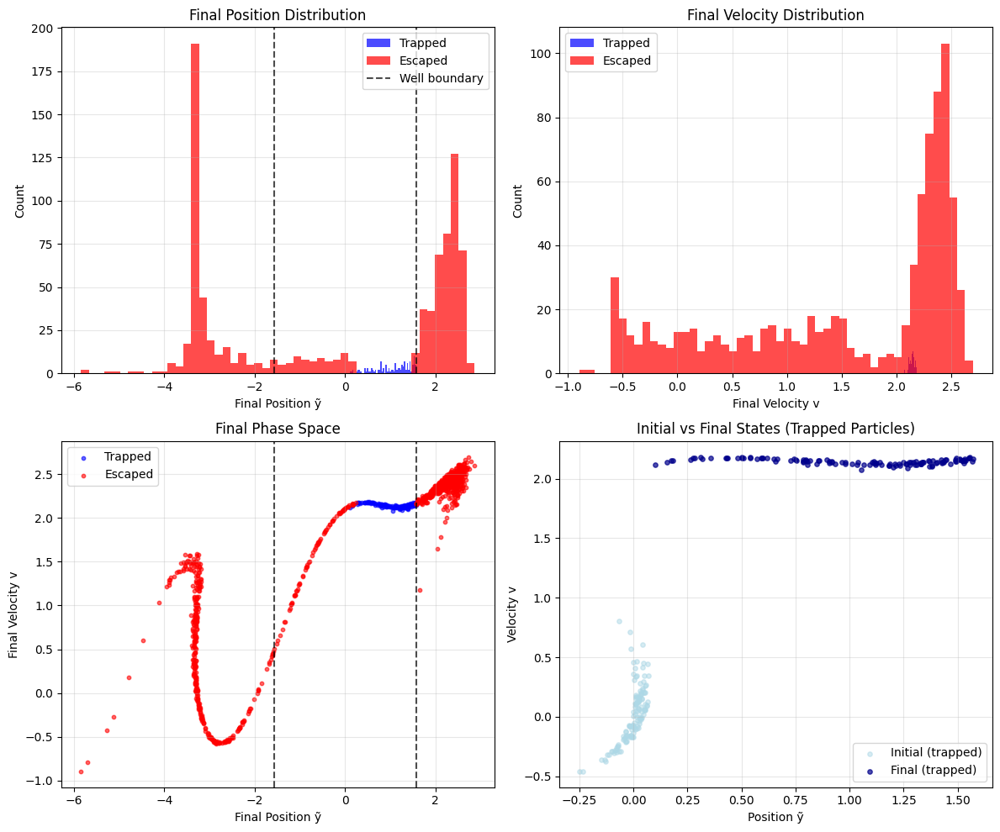

Final position range: [-5.845, 2.863]
Final velocity range: [-0.897, 2.699]
Trapped particles - position std: 0.398
Trapped particles - velocity std: 0.022


In [63]:
# Extract final states
final_positions = solutions.ys[:, -1, 0]  # All particles, last timepoint, position
final_velocities = solutions.ys[:, -1, 1]  # All particles, last timepoint, velocity

# Create the plot
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 10))

# 1. Final position histogram
ax1.hist(final_positions[trapped_status], bins=50, alpha=0.7, color='blue', label='Trapped')
ax1.hist(final_positions[~trapped_status], bins=50, alpha=0.7, color='red', label='Escaped')
ax1.axvline(jnp.pi/2, color='black', linestyle='--', alpha=0.7, label='Well boundary')
ax1.axvline(-jnp.pi/2, color='black', linestyle='--', alpha=0.7)
ax1.set_xlabel('Final Position ỹ')
ax1.set_ylabel('Count')
ax1.set_title('Final Position Distribution')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 2. Final velocity histogram
ax2.hist(final_velocities[trapped_status], bins=50, alpha=0.7, color='blue', label='Trapped')
ax2.hist(final_velocities[~trapped_status], bins=50, alpha=0.7, color='red', label='Escaped')
ax2.set_xlabel('Final Velocity v')
ax2.set_ylabel('Count')
ax2.set_title('Final Velocity Distribution')
ax2.legend()
ax2.grid(True, alpha=0.3)

# 3. Final phase space
ax3.scatter(final_positions[trapped_status], final_velocities[trapped_status], 
           alpha=0.6, s=10, color='blue', label='Trapped')
ax3.scatter(final_positions[~trapped_status], final_velocities[~trapped_status], 
           alpha=0.6, s=10, color='red', label='Escaped')
ax3.axvline(jnp.pi/2, color='black', linestyle='--', alpha=0.7)
ax3.axvline(-jnp.pi/2, color='black', linestyle='--', alpha=0.7)
ax3.set_xlabel('Final Position ỹ')
ax3.set_ylabel('Final Velocity v')
ax3.set_title('Final Phase Space')
ax3.legend()
ax3.grid(True, alpha=0.3)

# 4. Compare initial vs final (trapped particles only)
initial_positions = solutions.ys[trapped_status, 0, 0]  # Initial positions of trapped particles
initial_velocities = solutions.ys[trapped_status, 0, 1]  # Initial velocities of trapped particles

ax4.scatter(initial_positions, initial_velocities, alpha=0.5, s=15, color='lightblue', label='Initial (trapped)')
ax4.scatter(final_positions[trapped_status], final_velocities[trapped_status], 
           alpha=0.7, s=15, color='darkblue', label='Final (trapped)')
ax4.set_xlabel('Position ỹ')
ax4.set_ylabel('Velocity v')
ax4.set_title('Initial vs Final States (Trapped Particles)')
ax4.legend()
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print some statistics
print(f"Final position range: [{jnp.min(final_positions):.3f}, {jnp.max(final_positions):.3f}]")
print(f"Final velocity range: [{jnp.min(final_velocities):.3f}, {jnp.max(final_velocities):.3f}]")
print(f"Trapped particles - position std: {jnp.std(final_positions[trapped_status]):.3f}")
print(f"Trapped particles - velocity std: {jnp.std(final_velocities[trapped_status]):.3f}")

## Single particle example | DON'T DELETE YET

In [ ]:
# Initial conditions

y_tilde, v = sample_initial_conditions(key, 1000, T_tilde)


y0 = y_tilde[0]     # small displacement
v0 = v[0]    # at rest
state0 = jnp.array([y0, v0])

# Time span
t0, t1 = 0.0, total_tau

# Choose solver
solver = diffrax.Tsit5()

# Save solution at regular time points
saveat = diffrax.SaveAt(ts=jnp.linspace(t0, t1, 500))

# Solve
sol = diffrax.diffeqsolve(
    diffrax.ODETerm(rhs),
    solver,
    t0=t0,
    t1=t1,
    dt0=0.01,
    y0=state0,
    saveat=saveat,
)


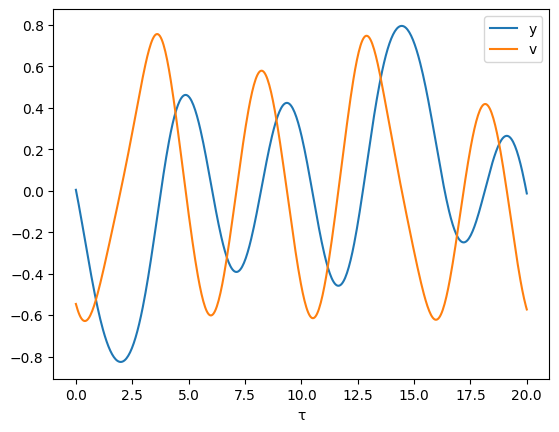

In [ ]:
ts = sol.ts
ys = sol.ys[:, 0]  # y(t)
vs = sol.ys[:, 1]  # v(t)

plt.plot(ts, ys, label="y")
plt.plot(ts, vs, label="v")
plt.legend()
plt.xlabel("τ")
plt.show()

We can think of this equation of motion as arising from an effective potential. To find it, we can integrate:

$$
U_{eff} (\tilde{y}, \tau) = \int d\tilde{y} \; \sin(2 \tilde{y}) + \frac{1}{2} \frac{d^2 \phi}{d \tau^2} (\tau) = -\frac{1}{2}\cos(2 \tilde{y}) + \frac{\tilde{y}}{2} \frac{d^2 \phi}{d \tau^2} (\tau)
$$

which essentially becomes a static lattice potential with a time dependent tilt (linear in $\tilde{y}$).

Let's write code for this!


In [ ]:
# First, we need to sample the initial conditions for our system

